#### Import necessary libraries

In [1]:
# Data processing
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Plotting
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns

# Encoders
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from category_encoders import TargetEncoder

# Helpers
from utils import *

#### Data Analysis
Define dtypes to avoid warings

In [3]:
dtype_dict = {
    "URL": "object",
    "accessionNumber": "object",
    "filingDate": "int64",
    "filerCik": "int64",
    "transactionType": "object",
    "tableRow": "int64",
    "securityTitle": "object",
    "securityTitleFn": "object",
    "conversionOrExercisePrice": "object",
    "conversionOrExercisePriceFn": "object",
    "transactionDate": "object",
    "transactionDateFn": "object",
    "deemedExecutionDate": "object",
    "deemedExecutionDateFn": "object",
    "transactionFormType": "object", # nan
    "transactionCode": "object",
    "equitySwapInvolved": "object", # nan
    "transactionCodeFn": "object",
    "transactionTimeliness": "object",
    "transactionTimelinessFn": "object",
    "transactionShares": "object", # float nan 480 0
    "transactionSharesFn": "object",
    "transactionTotalValue": "object", # float nan deleted
    "transactionTotalValueFn": "object",
    "transactionPricePerShare": "object", # 20 .2
    "transactionPricePerShareFn": "object",
    "transactionAcquiredDisposedCode": "object",
    "transactionAcquiredDisposedCdFn": "object",
    "exerciseDate": "object",
    "exerciseDateFn": "object",
    "expirationDate": "object",
    "expirationDateFn": "object",
    "underlyingSecurityTitle": "object",
    "underlyingSecurityTitleFn": "object",
    "underlyingSecurityShares": "object", # 2 5000
    "underlyingSecuritySharesFn": "object",
    "underlyingSecurityValue": "object",
    "underlyingSecurityValueFn": "object",
    "sharesOwnedFollowingTransaction": "object", # 540 9
    "sharesOwnedFolwngTransactionFn": "object",
    "valueOwnedFollowingTransaction": "object", # 1 0000 deleted
    "valueOwnedFolwngTransactionFn": "object",
    "directOrIndirectOwnership": "object",
    "directOrIndirectOwnershipFn": "object",
    "natureOfOwnership": "object",
    "natureOfOwnershipFn": "object",
}

In [4]:
dataFrame = pd.read_csv('data.csv', dtype=dtype_dict)
dataFrame.head()

,URL,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,...,underlyingSecurityValue,underlyingSecurityValueFn,sharesOwnedFollowingTransaction,sharesOwnedFolwngTransactionFn,valueOwnedFollowingTransaction,valueOwnedFolwngTransactionFn,directOrIndirectOwnership,directOrIndirectOwnershipFn,natureOfOwnership,natureOfOwnershipFn
0,https://www.sec.gov/Archives/edgar/data/118412...,0000856223-03-000034,20030630,1184122,derivativeTransaction,1,Employee Stock Option (right to buy),NaN,3.79,NaN,...,NaN,NaN,23027,"F2,F3",NaN,NaN,D,NaN,NaN,NaN
1,https://www.sec.gov/Archives/edgar/data/118412...,0000856223-03-000033,20030630,1184121,derivativeTransaction,1,Employee Stock Option (right to buy),NaN,3.79,NaN,...,NaN,NaN,30827,"F2,F4",NaN,NaN,D,NaN,NaN,NaN
2,https://www.sec.gov/Archives/edgar/data/120465...,0000046195-03-000056,20030505,1204659,derivativeTransaction,1,Director Stock Option,NaN,32.36,NaN,...,NaN,NaN,9000,NaN,NaN,NaN,D,NaN,NaN,NaN
3,https://www.sec.gov/Archives/edgar/data/120467...,0000046195-03-000059,20030505,1204676,derivativeTransaction,1,Director Stock Option,NaN,32.36,NaN,...,NaN,NaN,13000,NaN,NaN,NaN,D,NaN,NaN,NaN
4,https://www.sec.gov/Archives/edgar/data/120465...,0000046195-03-000051,20030505,1204652,derivativeTransaction,1,Director Stock Option,NaN,32.36,NaN,...,NaN,NaN,19000,NaN,NaN,NaN,D,NaN,NaN,NaN


Can see that in dataset are 46 columns different datatypes and so much Nan values

#### Missing Values Analysis

In [4]:
dataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10700177 entries, 0 to 10700176
Data columns (total 46 columns):
 #   Column                           Dtype 
---  ------                           ----- 
 0   URL                              object
 1   accessionNumber                  object
 2   filingDate                       int64 
 3   filerCik                         int64 
 4   transactionType                  object
 5   tableRow                         int64 
 6   securityTitle                    object
 7   securityTitleFn                  object
 8   conversionOrExercisePrice        object
 9   conversionOrExercisePriceFn      object
 10  transactionDate                  object
 11  transactionDateFn                object
 12  deemedExecutionDate              object
 13  deemedExecutionDateFn            object
 14  transactionFormType              object
 15  transactionCode                  object
 16  equitySwapInvolved               object
 17  transactionCodeFn        

In [5]:
dataFrame.isna().sum()

URL                                       0
accessionNumber                           0
filingDate                                0
filerCik                                  0
transactionType                           0
tableRow                                  0
securityTitle                           385
securityTitleFn                     9577899
conversionOrExercisePrice           2592459
conversionOrExercisePriceFn         7412882
transactionDate                     4378993
transactionDateFn                  10628170
deemedExecutionDate                10519299
deemedExecutionDateFn              10689992
transactionFormType                 4375371
transactionCode                     4379005
equitySwapInvolved                  4379005
transactionCodeFn                   9994996
transactionTimeliness              10638298
transactionTimelinessFn            10699391
transactionShares                   4408128
transactionSharesFn                10190603
transactionTotalValue           

In [39]:
nan_summary = analyze_nan(dataFrame)
print(nan_summary)

                                 NaN Count  NaN Percent
transactionTimelinessFn           10699391    99.992654
underlyingSecurityValueFn         10697475    99.974748
valueOwnedFolwngTransactionFn     10696106    99.961954
transactionTotalValueFn           10694972    99.951356
transactionAcquiredDisposedCdFn   10694076    99.942982
underlyingSecurityValue           10691748    99.921226
deemedExecutionDateFn             10689992    99.904815
valueOwnedFollowingTransaction    10671236    99.729528
transactionTotalValue             10671042    99.727715
transactionTimeliness             10638298    99.421701
transactionDateFn                 10628170    99.327049
underlyingSecurityTitleFn         10586183    98.934653
deemedExecutionDate               10519299    98.309579
directOrIndirectOwnershipFn       10464546    97.797878
transactionSharesFn               10190603    95.237705
underlyingSecuritySharesFn        10160550    94.956840
sharesOwnedFolwngTransactionFn    10055101    93

Can see that couple of columns have more then 90% nan values and we will drop them to make dataset smaller

In [40]:
cleaned_df = delete_high_nan_columns(dataFrame, nan_summary, threshold=90)

Dropping 19 columns:
- transactionTimelinessFn: 99.99% NaN
- underlyingSecurityValueFn: 99.97% NaN
- valueOwnedFolwngTransactionFn: 99.96% NaN
- transactionTotalValueFn: 99.95% NaN
- transactionAcquiredDisposedCdFn: 99.94% NaN
- underlyingSecurityValue: 99.92% NaN
- deemedExecutionDateFn: 99.90% NaN
- valueOwnedFollowingTransaction: 99.73% NaN
- transactionTotalValue: 99.73% NaN
- transactionTimeliness: 99.42% NaN
- transactionDateFn: 99.33% NaN
- underlyingSecurityTitleFn: 98.93% NaN
- deemedExecutionDate: 98.31% NaN
- directOrIndirectOwnershipFn: 97.80% NaN
- transactionSharesFn: 95.24% NaN
- underlyingSecuritySharesFn: 94.96% NaN
- sharesOwnedFolwngTransactionFn: 93.97% NaN
- transactionCodeFn: 93.41% NaN
- natureOfOwnershipFn: 93.03% NaN

Original DataFrame shape: (10700177, 46)
Cleaned DataFrame shape: (10700177, 27)


In [47]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10700177 entries, 0 to 10700176
Data columns (total 27 columns):
 #   Column                           Dtype  
---  ------                           -----  
 0   URL                              object 
 1   accessionNumber                  object 
 2   filingDate                       int64  
 3   filerCik                         int64  
 4   transactionType                  object 
 5   tableRow                         int64  
 6   securityTitle                    object 
 7   securityTitleFn                  object 
 8   conversionOrExercisePrice        float64
 9   conversionOrExercisePriceFn      object 
 10  transactionDate                  object 
 11  transactionFormType              Int64  
 12  transactionCode                  Int64  
 13  equitySwapInvolved               boolean
 14  transactionShares                float64
 15  transactionPricePerShare         float64
 16  transactionPricePerShareFn       object 
 17  transa

#### Data Cleaning

Was notice that in dataset are columns mostly as numbers but wrote in wrong way like (23, 3) same mining but different indentation like (0,1,False, True)

In [42]:
mapping = {
       '0': False,
       '1': True,
       'false': False,
       'true': True
   }
   
# Replace values using the mapping, convert to boolean, and fill NaN with False assuming that there were no swaps
cleaned_df['equitySwapInvolved'] = cleaned_df['equitySwapInvolved'].map(mapping).astype('boolean')
cleaned_df['equitySwapInvolved'] = cleaned_df['equitySwapInvolved'].fillna(False)

In [43]:
# List of columns to clean
columns_to_clean = [
    'transactionShares', 
    'transactionPricePerShare', 
    'underlyingSecurityShares', 
    'sharesOwnedFollowingTransaction',
]

cleaned_df = clean_numeric_columns_with_spaces(cleaned_df, columns_to_clean)

In [44]:
print(cleaned_df['transactionCode'].unique())
print(cleaned_df['transactionAcquiredDisposedCode'].unique())

['M' 'A' nan 'J' 'X' 'P' 'C' 'D' 'H' 'S' 'G' 'E' 'I' 'W' 'U' 'F' 'O' 'L'
 'Z']
['D' 'A' nan]


In [45]:
columns_to_encode = ['transactionCode', 'directOrIndirectOwnership']
cleaned_df = label_encode_series(cleaned_df, columns_to_encode)

mapping = {
       'A': 0,
       'D': 2,
       'nan': pd.NA,
   }
cleaned_df['transactionAcquiredDisposedCode'] = cleaned_df['transactionAcquiredDisposedCode'].map(mapping).astype('Int64')

In [46]:
# List of columns to convert
columns_to_convert = [
    'transactionFormType',
    'transactionShares',
    'transactionPricePerShare',
    'underlyingSecurityShares',
    'sharesOwnedFollowingTransaction',
    'conversionOrExercisePrice',
    'transactionCode',
    'directOrIndirectOwnership',
]

cleaned_df = convert_numeric_columns(cleaned_df, columns_to_convert)

<Axes: >

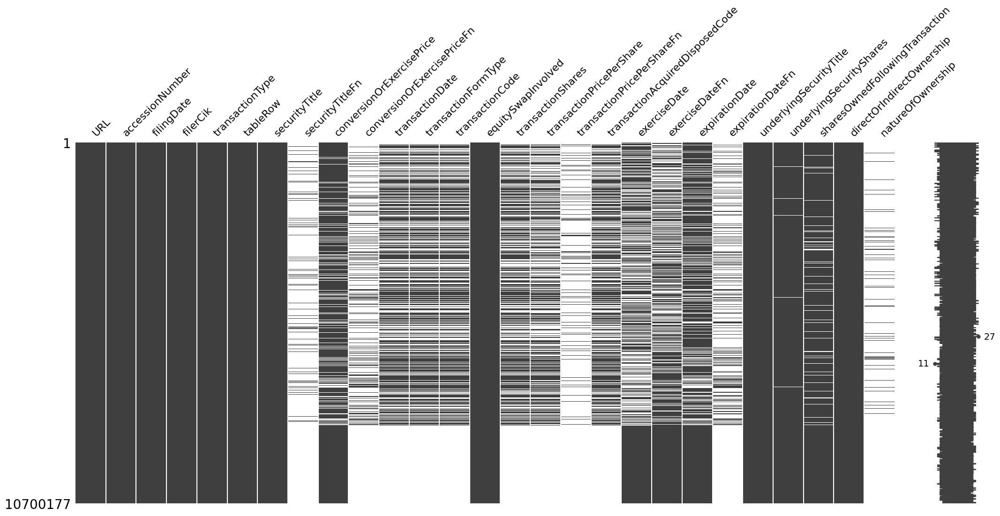

In [14]:
msno.matrix(cleaned_df)

As we can see on plot we have so much nan values 
    <ol>
        <li>We will Encode our categorical columns</li>
        <li>Will impute nan values</li>
    </ol>

#### Data Preprocessing

In [14]:
# Encode the target variable
le = LabelEncoder()
cleaned_df['transactionType'] = le.fit_transform(cleaned_df['transactionType'])

In [15]:
categorical_cols = cleaned_df.select_dtypes(include=['object', 'boolean']).columns.tolist()

target_encoder = TargetEncoder(cols=categorical_cols, handle_missing='return_nan')
cleaned_df[categorical_cols] = target_encoder.fit_transform(cleaned_df[categorical_cols], cleaned_df['transactionType'])
cleaned_df_copy = cleaned_df.copy()
cleaned_df.head(10)

,URL,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,...,transactionAcquiredDisposedCode,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
0,0.644001,0.648807,20030630,1184122,1,1,0.636278,NaN,3.79,NaN,...,2,0.323810,NaN,0.515904,NaN,0.597591,23027.0,23027.0,0,NaN
1,0.644001,0.648807,20030630,1184121,1,1,0.636278,NaN,3.79,NaN,...,2,0.323810,NaN,0.515904,NaN,0.597591,30827.0,30827.0,0,NaN
2,0.644001,0.648807,20030505,1204659,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,9000.0,0,NaN
3,0.644001,0.648807,20030505,1204676,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,13000.0,0,NaN
4,0.644001,0.648807,20030505,1204652,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,19000.0,0,NaN
5,0.644001,0.648807,20030505,1204653,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,19000.0,0,NaN
6,0.644001,0.648807,20030505,1204655,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,14000.0,0,NaN
7,0.644001,0.648807,20030505,1204651,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,14000.0,0,NaN
8,0.644001,0.648807,20030505,1204656,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,19000.0,0,NaN
9,0.644001,0.648807,20030505,1204674,1,1,0.464683,NaN,32.36,NaN,...,0,0.412144,NaN,0.326128,NaN,0.581449,3000.0,12000.0,0,NaN


In [16]:
cleaned_df.describe().applymap(lambda x: format(x, '.3f'))

,URL,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,...,transactionAcquiredDisposedCode,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
count,10700177.000,10700177.000,10700177.000,10700177.000,10700177.000,10700177.000,10699792.000,1122278.000,8107110.000,3287295.000,...,6321184.000,5121201.000,7088236.000,7578231.000,3352757.000,10699282.000,10609196.000,9795899.000,10700177.000,1165101.000
mean,0.573,0.548,20120494.914,1109963.099,0.591,3.407,0.590,0.556,233914.886,0.723,...,0.966,0.483,0.654,0.530,0.734,0.591,1449552.190,1112006.126,0.109,0.471
std,0.112,0.196,61263.319,445750.172,0.492,3.731,0.232,0.172,286657288.045,0.172,...,0.999,0.216,0.118,0.198,0.116,0.107,324575141.324,236251435.367,0.312,0.287
min,0.159,0.000,20030505.000,20.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,0.483,0.432,20061229.000,921669.000,0.000,1.000,0.450,0.413,3.000,0.645,...,0.000,0.324,0.592,0.384,0.693,0.598,2000.000,1375.000,0.000,0.247
50%,0.644,0.649,20110809.000,1195500.000,1.000,2.000,0.591,0.482,13.100,0.747,...,0.000,0.467,0.685,0.523,0.786,0.598,7896.000,8000.000,0.000,0.506
75%,0.649,0.660,20170802.000,1376769.000,1.000,4.000,0.807,0.751,28.440,0.874,...,2.000,0.640,0.744,0.676,0.793,0.598,30000.000,35000.000,0.000,0.637
max,0.890,1.000,20240628.000,2028892.000,1.000,30.000,1.000,1.000,400000000000.000,1.000,...,2.000,1.000,1.000,1.000,1.000,1.000,400000000000.000,400000000000.000,1.000,1.000


<Axes: >

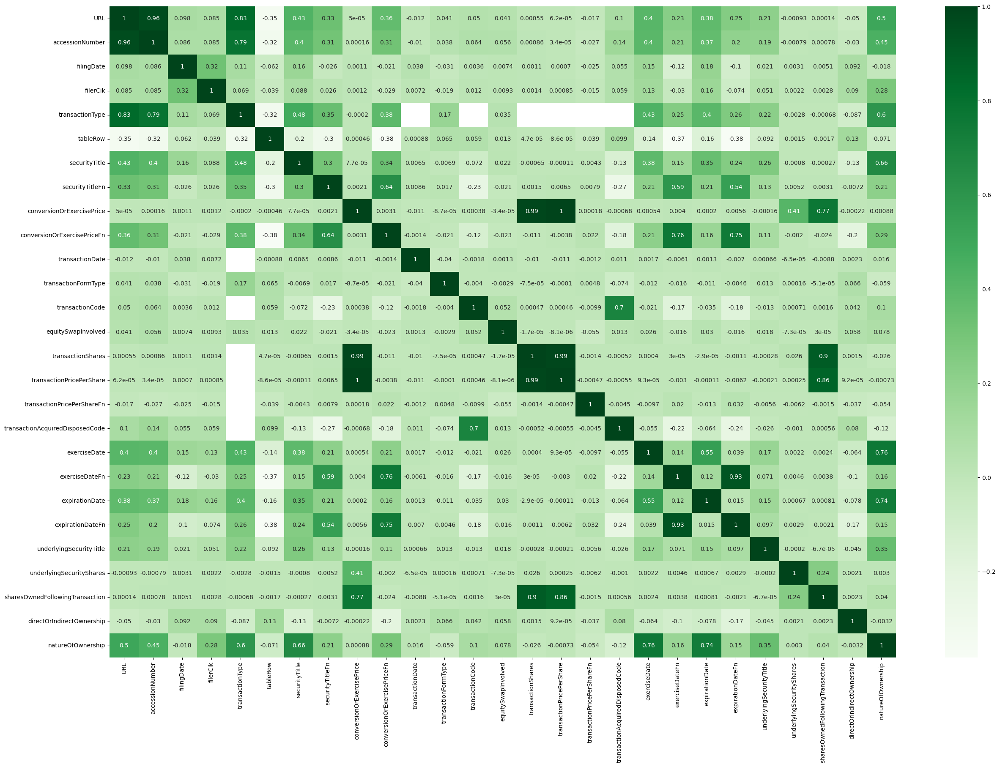

In [17]:
plt.figure(figsize=(30, 20))
sns.heatmap(cleaned_df.corr(), annot=True, cmap='Greens')

Can see that with transactionType column we have most correlation with URL(not informative) accessionNumber and natureOfOwnership (more informative)

In [18]:
imputer = IterativeImputer(max_iter=5, random_state=0)

cleaned_df = pd.DataFrame(imputer.fit_transform(cleaned_df), columns=cleaned_df.columns)

cleaned_df.head(10)

c:\Users\Max\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\impute\_iterative.py:796: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


,URL,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,...,transactionAcquiredDisposedCode,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
0,0.644001,0.648807,20030630.0,1184122.0,1.0,1.0,0.636278,0.559046,3.79,0.738801,...,2.0,0.323810,0.683848,0.515904,0.777144,0.597591,23027.0,23027.0,0.0,0.489564
1,0.644001,0.648807,20030630.0,1184121.0,1.0,1.0,0.636278,0.557629,3.79,0.737371,...,2.0,0.323810,0.683569,0.515904,0.774875,0.597591,30827.0,30827.0,0.0,0.493646
2,0.644001,0.648807,20030505.0,1204659.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,9000.0,0.0,0.523641
3,0.644001,0.648807,20030505.0,1204676.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,13000.0,0.0,0.523642
4,0.644001,0.648807,20030505.0,1204652.0,1.0,1.0,0.464683,0.673999,32.36,0.684384,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,19000.0,0.0,0.523642
5,0.644001,0.648807,20030505.0,1204653.0,1.0,1.0,0.464683,0.673999,32.36,0.684384,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,19000.0,0.0,0.523642
6,0.644001,0.648807,20030505.0,1204655.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,14000.0,0.0,0.523642
7,0.644001,0.648807,20030505.0,1204651.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,14000.0,0.0,0.523642
8,0.644001,0.648807,20030505.0,1204656.0,1.0,1.0,0.464683,0.673999,32.36,0.684384,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,19000.0,0.0,0.523642
9,0.644001,0.648807,20030505.0,1204674.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,12000.0,0.0,0.523642


<Axes: >

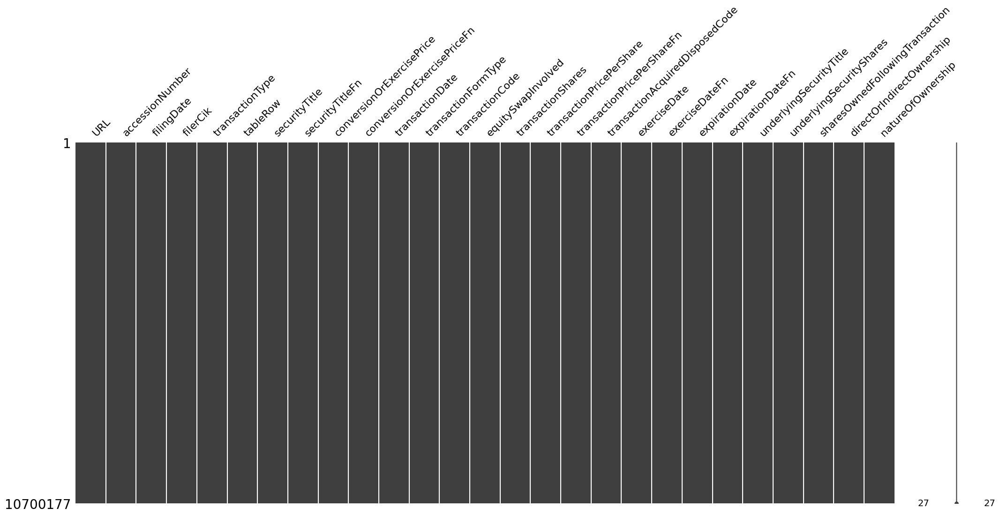

In [19]:
msno.matrix(cleaned_df)

Now we have our dataset cleaned of nan values

In [20]:
cleaned_df.isna().sum()

URL                                0
accessionNumber                    0
filingDate                         0
filerCik                           0
transactionType                    0
tableRow                           0
securityTitle                      0
securityTitleFn                    0
conversionOrExercisePrice          0
conversionOrExercisePriceFn        0
transactionDate                    0
transactionFormType                0
transactionCode                    0
equitySwapInvolved                 0
transactionShares                  0
transactionPricePerShare           0
transactionPricePerShareFn         0
transactionAcquiredDisposedCode    0
exerciseDate                       0
exerciseDateFn                     0
expirationDate                     0
expirationDateFn                   0
underlyingSecurityTitle            0
underlyingSecurityShares           0
sharesOwnedFollowingTransaction    0
directOrIndirectOwnership          0
natureOfOwnership                  0
d

d:\Institute\Internship\Sigmoid\Sigmoid_Internship\Exam_01_07_2024_1\utils.py:116: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\Max\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


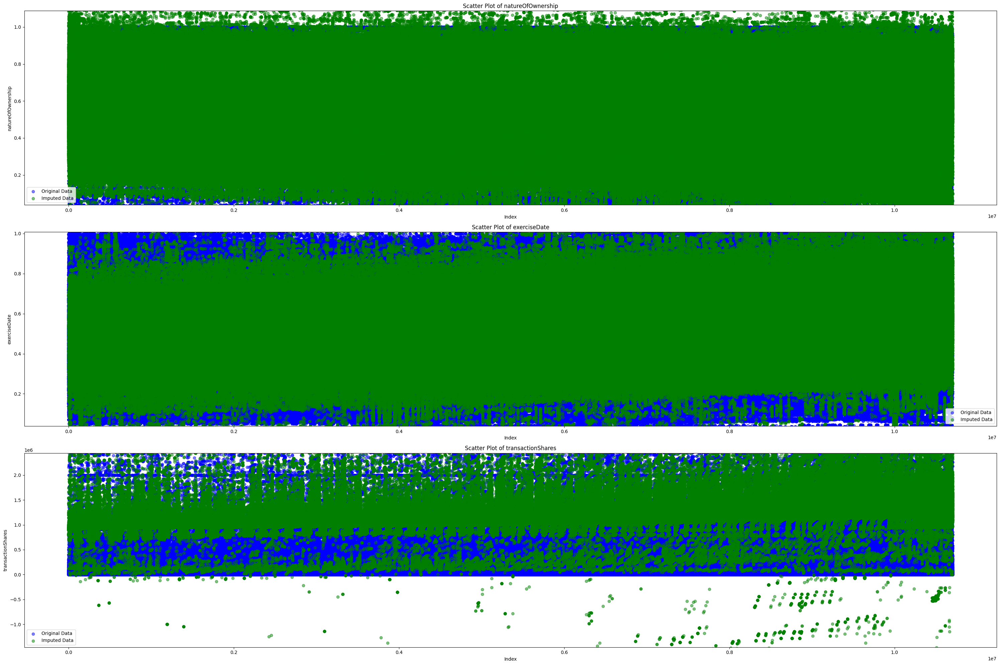

In [17]:
columns_to_plot = ['natureOfOwnership', 'exerciseDate','transactionShares']
plot_imputed_scatter(cleaned_df_copy, cleaned_df, columns_to_plot)

As we can see that Nan values was imputed ok because it is pretty similar as our original dataset

<Axes: >

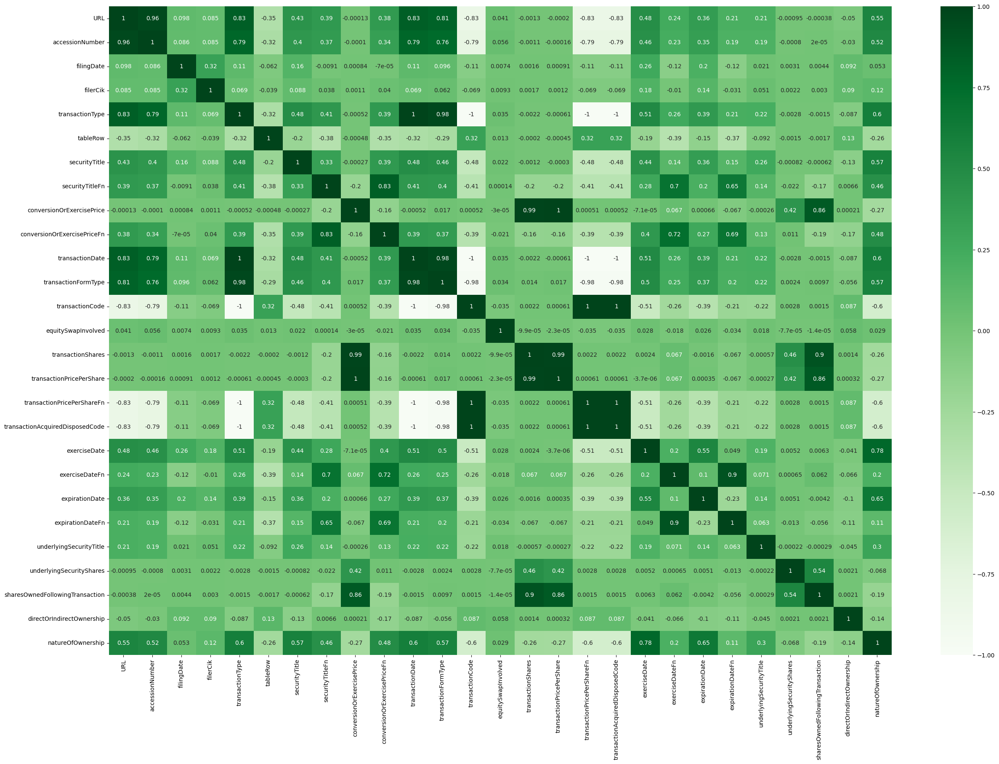

In [18]:
plt.figure(figsize=(30, 20))
correlationMatrix = cleaned_df.corr()
sns.heatmap(correlationMatrix, annot=True, cmap='Greens')

<p>After missing values we gave more correlation between columns</p>
<p>But we have correlation like 1 -1 and 0.97, that shows redundancy of data (identify same meaning)</p>

In [19]:
correlationMatrix['transactionType'].abs().sort_values(ascending=False)

transactionType                    1.000000
transactionCode                    1.000000
transactionPricePerShareFn         1.000000
transactionDate                    1.000000
transactionAcquiredDisposedCode    1.000000
transactionFormType                0.976258
URL                                0.832556
accessionNumber                    0.785400
natureOfOwnership                  0.598925
exerciseDate                       0.510171
securityTitle                      0.480565
securityTitleFn                    0.405858
conversionOrExercisePriceFn        0.389056
expirationDate                     0.385722
tableRow                           0.322115
exerciseDateFn                     0.256851
underlyingSecurityTitle            0.220974
expirationDateFn                   0.211870
filingDate                         0.107441
directOrIndirectOwnership          0.087218
filerCik                           0.069064
equitySwapInvolved                 0.035377
underlyingSecurityShares        

In [24]:
cleaned_df.to_csv('cleaned_data.csv', index=False)

<p>Our dataset become so big more then 10 mln rows and it takes a lot of memory and TIME</p>
<p>That's why i will use Dask</p>

In [3]:
# Multi-threaded processing
import dask
import dask.dataframe as dd

# Plotting
import hvplot.dask

cleaned_df = dd.read_csv('cleaned_data.csv')
cleaned_df.head()

,URL,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,...,transactionAcquiredDisposedCode,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
0,0.644001,0.648807,20030630.0,1184122.0,1.0,1.0,0.636278,0.559046,3.79,0.738801,...,2.0,0.323810,0.683848,0.515904,0.777144,0.597591,23027.0,23027.0,0.0,0.489564
1,0.644001,0.648807,20030630.0,1184121.0,1.0,1.0,0.636278,0.557629,3.79,0.737371,...,2.0,0.323810,0.683569,0.515904,0.774875,0.597591,30827.0,30827.0,0.0,0.493646
2,0.644001,0.648807,20030505.0,1204659.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,9000.0,0.0,0.523641
3,0.644001,0.648807,20030505.0,1204676.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,...,0.0,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,13000.0,0.0,0.523642
4,0.644001,0.648807,20030505.0,1204652.0,1.0,1.0,0.464683,0.673999,32.36,0.684384,...,0.0,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,19000.0,0.0,0.523642


As i mention before I will drop redundant columns

In [3]:
cleaned_df = cleaned_df.drop(columns=['transactionCode', 'transactionPricePerShareFn', 'transactionDate', 'transactionAcquiredDisposedCode', 'transactionFormType', 'URL'])
cleaned_df.head()

,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,equitySwapInvolved,...,transactionPricePerShare,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
0,0.648807,20030630.0,1184122.0,1.0,1.0,0.636278,0.559046,3.79,0.738801,0.590016,...,3.79,0.323810,0.683848,0.515904,0.777144,0.597591,23027.0,23027.0,0.0,0.489564
1,0.648807,20030630.0,1184121.0,1.0,1.0,0.636278,0.557629,3.79,0.737371,0.590016,...,3.79,0.323810,0.683569,0.515904,0.774875,0.597591,30827.0,30827.0,0.0,0.493646
2,0.648807,20030505.0,1204659.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,0.590016,...,0.00,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,9000.0,0.0,0.523641
3,0.648807,20030505.0,1204676.0,1.0,1.0,0.464683,0.673999,32.36,0.684385,0.590016,...,0.00,0.412144,0.696083,0.326128,0.804451,0.581449,3000.0,13000.0,0.0,0.523642
4,0.648807,20030505.0,1204652.0,1.0,1.0,0.464683,0.673999,32.36,0.684384,0.590016,...,0.00,0.412144,0.696083,0.326128,0.804450,0.581449,3000.0,19000.0,0.0,0.523642


In [42]:
cleaned_df.describe().compute().transpose().applymap(lambda x: format(x, '.3f'))

,count,mean,std,min,25%,50%,75%,max
accessionNumber,10700177.000,0.548,0.196,0.000,0.507,0.649,0.685,1.000
filingDate,10700177.000,20120494.914,61263.319,20030505.000,20070103.000,20110706.000,20170707.000,20240628.000
filerCik,10700177.000,1109963.099,445750.172,20.000,1105215.000,1248922.250,1479780.000,2028892.000
transactionType,10700177.000,0.591,0.492,0.000,0.000,1.000,1.000,1.000
tableRow,10700177.000,3.407,3.731,1.000,1.000,2.000,5.000,30.000
securityTitle,10700177.000,0.590,0.232,-0.511,0.575,0.636,0.827,1.515
securityTitleFn,10700177.000,0.579,0.132,-61.839,0.515,0.602,0.724,11.676
conversionOrExercisePrice,10700177.000,274256.181,251018256.563,-985601096.179,3.430,15.210,310268.327,400000000000.000
conversionOrExercisePriceFn,10700177.000,0.705,0.147,-72.772,0.645,0.747,0.874,19.751
equitySwapInvolved,10700177.000,0.591,0.017,0.590,0.590,0.590,0.590,1.000


Can see that data has negative values where it's not should be and we have so big range of data in couple of columns from negative millions to positive one and we will delete '-' sign from data and after will scale the data

In [4]:
columns_to_check = ['securityTitle', 'securityTitleFn', 'conversionOrExercisePrice', 'conversionOrExercisePriceFn', 
                    'transactionShares', 'transactionPricePerShare', 'exerciseDate', 
                    'exerciseDateFn', 'expirationDate', 'expirationDateFn', 
                    'underlyingSecurityShares', 'sharesOwnedFollowingTransaction', 
                    'natureOfOwnership']

cleaned_df = handle_negative_values(cleaned_df, columns_to_check)

#### Outlier Analysis

In [9]:
numerical_columns = cleaned_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

for col in numerical_columns:
    q1 = cleaned_df[col].quantile(0.25).compute()
    q3 = cleaned_df[col].quantile(0.75).compute()
    irq = q3 - q1
    outliers = cleaned_df[(cleaned_df[col] <= q1 - 1.5 * irq) | (cleaned_df[col] >= q3 + 1.5 * irq)]
    perc = outliers.shape[0].compute() * 100.0 / cleaned_df.shape[0].compute()
    print(f"Column {col} outliers = {perc:.2f}%")

Column accessionNumber outliers = 10.88%
Column filingDate outliers = 0.00%
Column filerCik outliers = 11.39%
Column transactionType outliers = 0.00%
Column tableRow outliers = 5.48%
Column securityTitle outliers = 6.90%
Column securityTitleFn outliers = 0.11%
Column conversionOrExercisePrice outliers = 1.09%
Column conversionOrExercisePriceFn outliers = 0.38%
Column equitySwapInvolved outliers = 100.00%
Column transactionShares outliers = 0.82%
Column transactionPricePerShare outliers = 1.22%
Column exerciseDate outliers = 16.34%
Column exerciseDateFn outliers = 10.76%
Column expirationDate outliers = 3.30%
Column expirationDateFn outliers = 11.61%
Column underlyingSecurityTitle outliers = 100.00%
Column underlyingSecurityShares outliers = 7.41%
Column sharesOwnedFollowingTransaction outliers = 3.52%
Column directOrIndirectOwnership outliers = 0.00%
Column natureOfOwnership outliers = 4.51%


More interesting are accessionNumber and natureOfOwnership because they have the biggest correlation with transactionType column and from beginning was numerical data

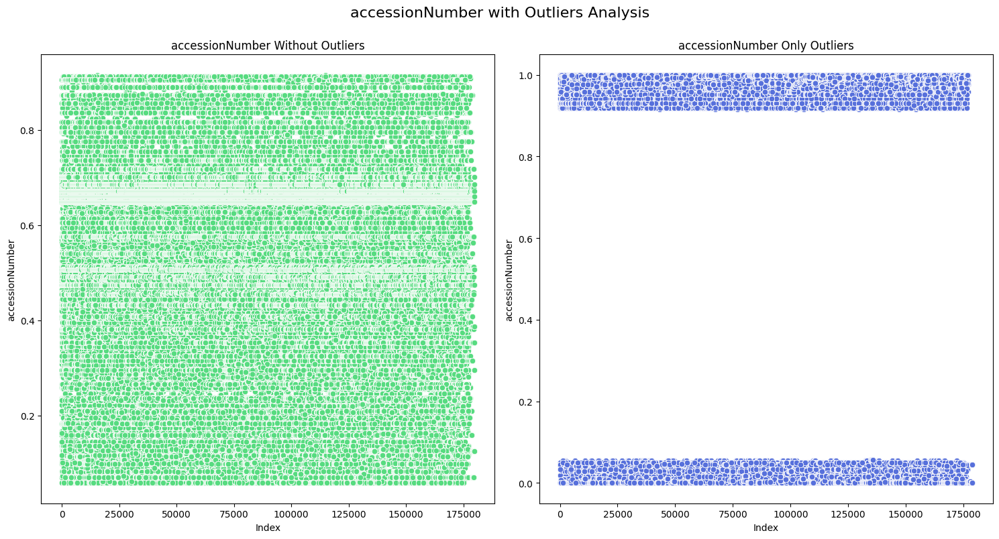

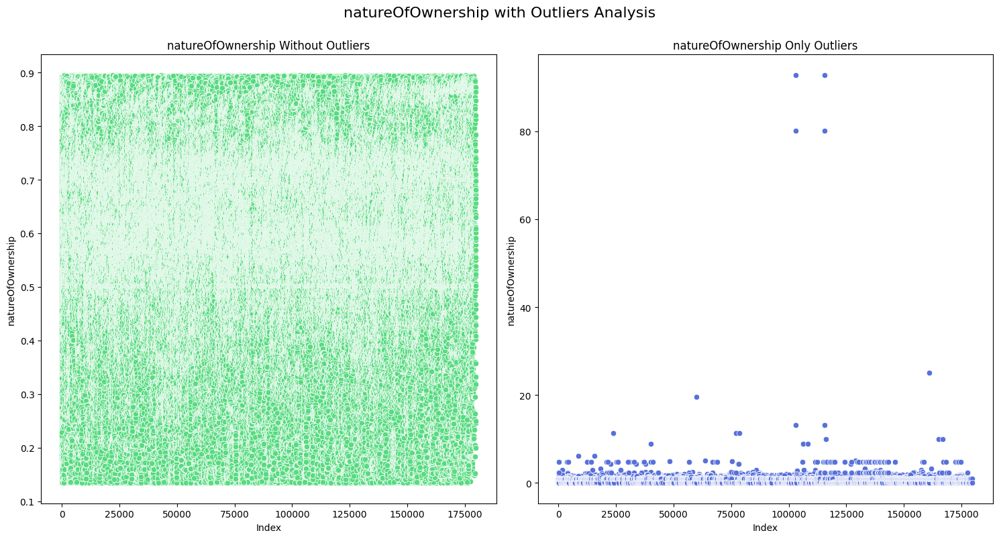

In [5]:
%matplotlib inline
# Initialize Isolation Forest model
model = IsolationForest(contamination=0.05)

# Specify columns to check for outliers
columns_outliers = ['accessionNumber', 'natureOfOwnership']

# Convert Dask DataFrame to Pandas DataFrame for outlier detection
pandas_df = cleaned_df.compute()

# Dictionary to map column names to their specific outlier labels
outlier_labels = {
    'accessionNumber': {'inlier': 0, 'outlier': -1},
    'natureOfOwnership': {'inlier': 0, 'outlier': -2}
}

for col in columns_outliers:
    # Fit Isolation Forest and predict outliers
    X = pandas_df[[col]]
    model.fit(X)
    pandas_df['is_outlier'] = model.predict(X)
    
    # Modify the outlier labels as specified
    pandas_df['is_outlier'] = pandas_df['is_outlier'].replace({
        1: outlier_labels[col]['inlier'], 
        -1: outlier_labels[col]['outlier']
    }).astype('category')

    # Plotting
    colors = sns.color_palette("hls", 8)
    plt.figure(figsize=(15, 8))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=pandas_df[pandas_df['is_outlier'] == outlier_labels[col]['inlier']].index, y=pandas_df[pandas_df['is_outlier'] == outlier_labels[col]['inlier']][col], color=colors[3])
    plt.title(f'{col} Without Outliers')
    plt.xlabel('Index')
    plt.ylabel(col)

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=pandas_df[pandas_df['is_outlier'] == outlier_labels[col]['outlier']].index, y=pandas_df[pandas_df['is_outlier'] == outlier_labels[col]['outlier']][col], color=colors[5])
    plt.title(f'{col} Only Outliers')
    plt.xlabel('Index')
    plt.ylabel(col)

    plt.suptitle(f'{col} with Outliers Analysis', fontsize=16, y=1)
    plt.tight_layout()
    plt.show()

accessionNumber outliers looks normal but natureOfOwnership outliers we will drop 

In [6]:
# Remove outliers from the 'natureOfOwnership' column
pandas_df = pandas_df[pandas_df['is_outlier'] != outlier_labels['natureOfOwnership']['outlier']]
pandas_df.drop(columns=['is_outlier'], inplace=True)

In [7]:
cleaned_df = dd.from_pandas(pandas_df, npartitions=cleaned_df.npartitions)

In [8]:
hvplot.extension('bokeh')
cleaned_df.hvplot.box(y='accessionNumber')

:BoxWhisker   (accessionNumber)

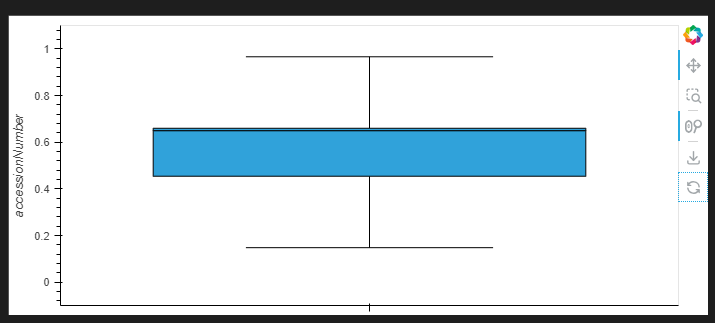

In [9]:
hvplot.extension('bokeh')
cleaned_df.hvplot.box(y='natureOfOwnership')

:BoxWhisker   (natureOfOwnership)

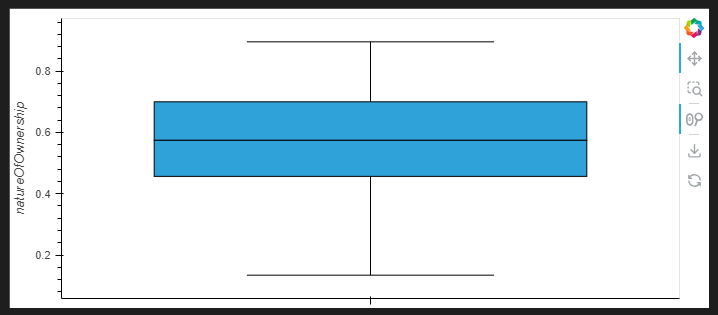

On box plots we can see that we don't have outliers and data looks good

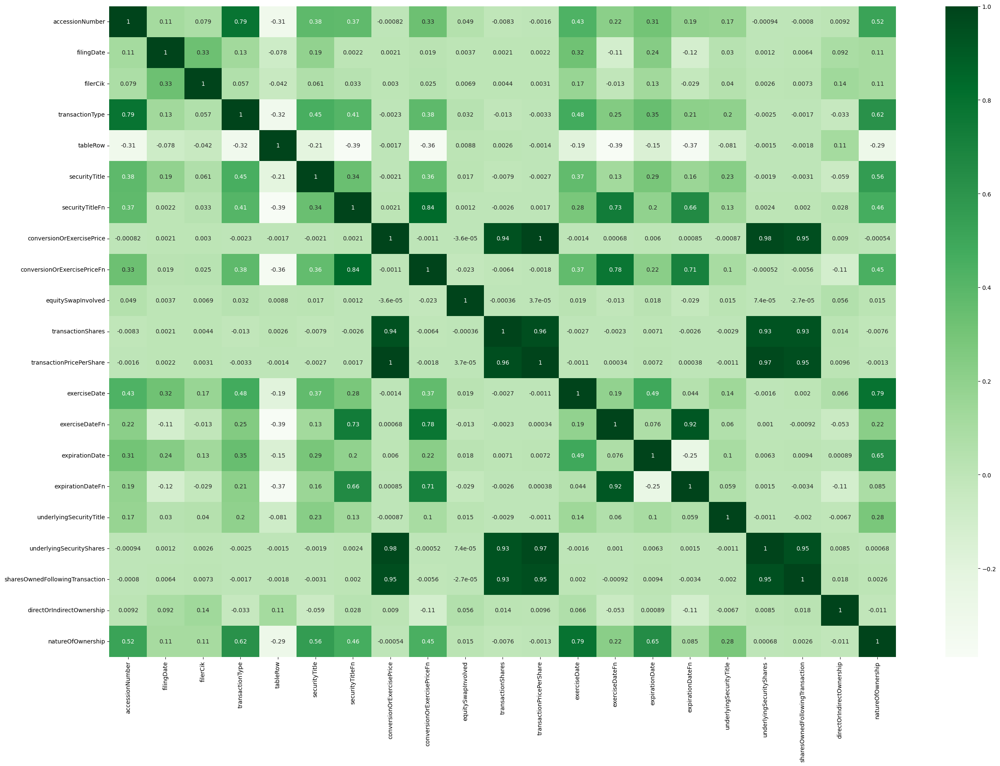

In [11]:
corelation = cleaned_df.corr().compute()

plt.figure(figsize=(30, 20))
sns.heatmap(corelation, annot=True, cmap="Greens")
plt.show()

#### Data Distribution

In [51]:
for col in cleaned_df.columns:
    display(cleaned_df.hvplot.hist(y=col, normed=True) * cleaned_df.hvplot.kde(y=col))

:Overlay
   .Histogram.I    :Histogram   [accessionNumber]   (accessionNumber_frequency)
   .Distribution.I :Distribution   [accessionNumber]   (Density)

:Overlay
   .Histogram.I    :Histogram   [filingDate]   (filingDate_frequency)
   .Distribution.I :Distribution   [filingDate]   (Density)

:Overlay
   .Histogram.I    :Histogram   [filerCik]   (filerCik_frequency)
   .Distribution.I :Distribution   [filerCik]   (Density)

:Overlay
   .Histogram.I    :Histogram   [transactionType]   (transactionType_frequency)
   .Distribution.I :Distribution   [transactionType]   (Density)

:Overlay
   .Histogram.I    :Histogram   [tableRow]   (tableRow_frequency)
   .Distribution.I :Distribution   [tableRow]   (Density)

:Overlay
   .Histogram.I    :Histogram   [securityTitle]   (securityTitle_frequency)
   .Distribution.I :Distribution   [securityTitle]   (Density)

:Overlay
   .Histogram.I    :Histogram   [securityTitleFn]   (securityTitleFn_frequency)
   .Distribution.I :Distribution   [securityTitleFn]   (Density)

:Overlay
   .Histogram.I    :Histogram   [conversionOrExercisePrice]   (conversionOrExercisePrice_frequency)
   .Distribution.I :Distribution   [conversionOrExercisePrice]   (Density)

:Overlay
   .Histogram.I    :Histogram   [conversionOrExercisePriceFn]   (conversionOrExercisePriceFn_frequency)
   .Distribution.I :Distribution   [conversionOrExercisePriceFn]   (Density)

:Overlay
   .Histogram.I    :Histogram   [equitySwapInvolved]   (equitySwapInvolved_frequency)
   .Distribution.I :Distribution   [equitySwapInvolved]   (Density)

:Overlay
   .Histogram.I    :Histogram   [transactionShares]   (transactionShares_frequency)
   .Distribution.I :Distribution   [transactionShares]   (Density)

:Overlay
   .Histogram.I    :Histogram   [transactionPricePerShare]   (transactionPricePerShare_frequency)
   .Distribution.I :Distribution   [transactionPricePerShare]   (Density)

:Overlay
   .Histogram.I    :Histogram   [exerciseDate]   (exerciseDate_frequency)
   .Distribution.I :Distribution   [exerciseDate]   (Density)

:Overlay
   .Histogram.I    :Histogram   [exerciseDateFn]   (exerciseDateFn_frequency)
   .Distribution.I :Distribution   [exerciseDateFn]   (Density)

:Overlay
   .Histogram.I    :Histogram   [expirationDate]   (expirationDate_frequency)
   .Distribution.I :Distribution   [expirationDate]   (Density)

:Overlay
   .Histogram.I    :Histogram   [expirationDateFn]   (expirationDateFn_frequency)
   .Distribution.I :Distribution   [expirationDateFn]   (Density)

:Overlay
   .Histogram.I    :Histogram   [underlyingSecurityTitle]   (underlyingSecurityTitle_frequency)
   .Distribution.I :Distribution   [underlyingSecurityTitle]   (Density)

:Overlay
   .Histogram.I    :Histogram   [underlyingSecurityShares]   (underlyingSecurityShares_frequency)
   .Distribution.I :Distribution   [underlyingSecurityShares]   (Density)

:Overlay
   .Histogram.I    :Histogram   [sharesOwnedFollowingTransaction]   (sharesOwnedFollowingTransaction_frequency)
   .Distribution.I :Distribution   [sharesOwnedFollowingTransaction]   (Density)

:Overlay
   .Histogram.I    :Histogram   [directOrIndirectOwnership]   (directOrIndirectOwnership_frequency)
   .Distribution.I :Distribution   [directOrIndirectOwnership]   (Density)

:Overlay
   .Histogram.I    :Histogram   [natureOfOwnership]   (natureOfOwnership_frequency)
   .Distribution.I :Distribution   [natureOfOwnership]   (Density)

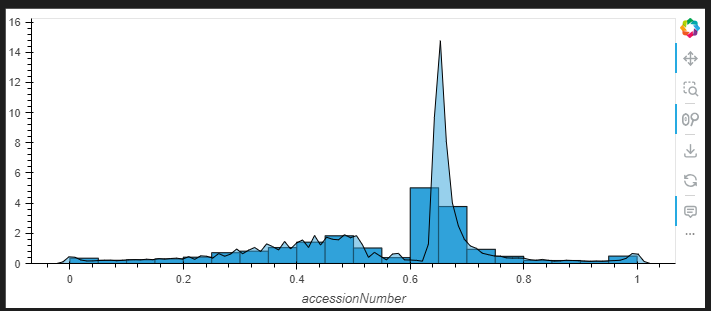
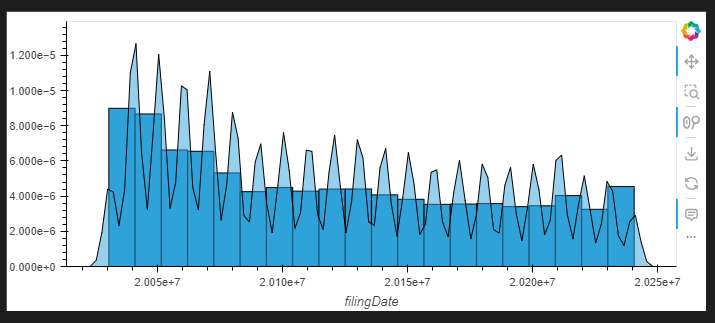
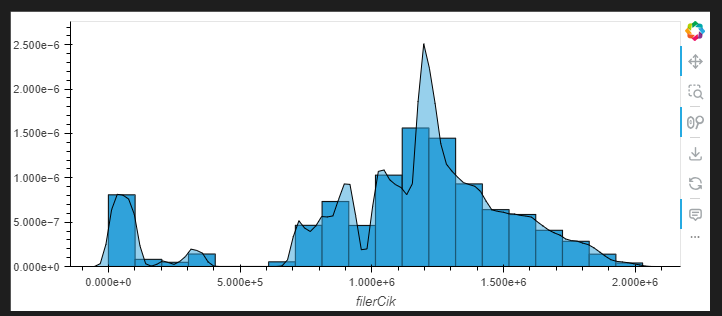
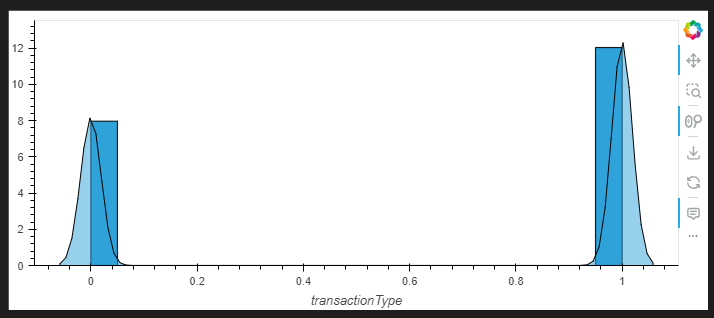
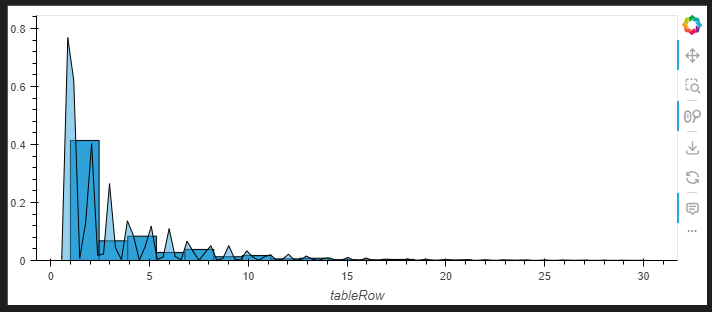
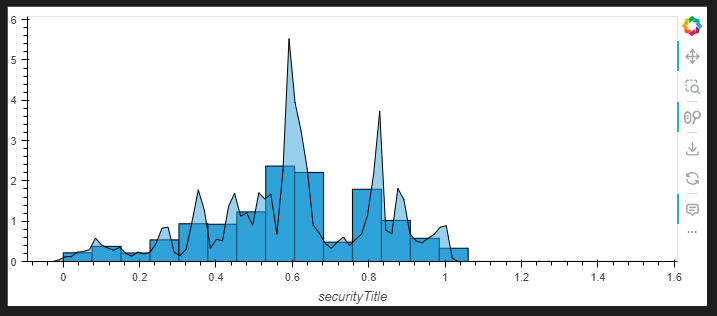
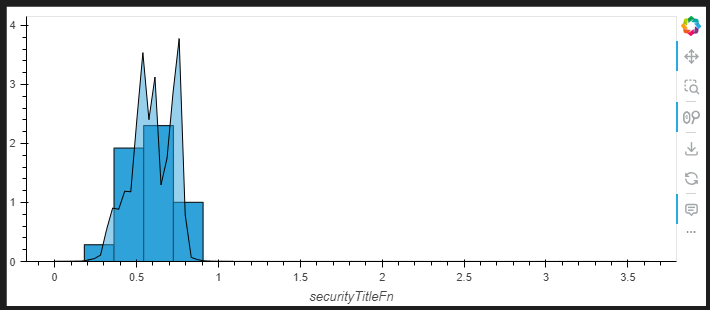
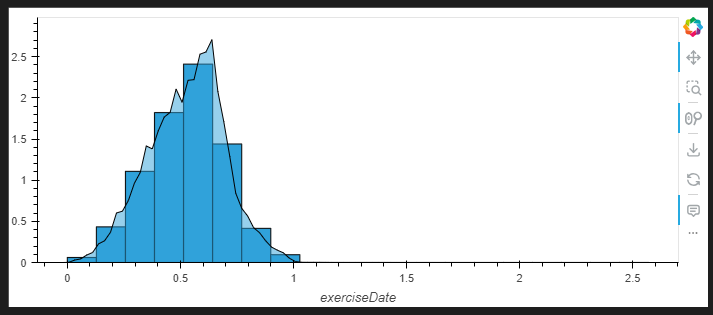
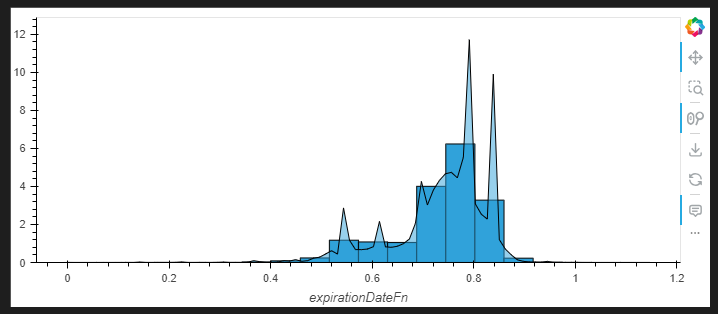
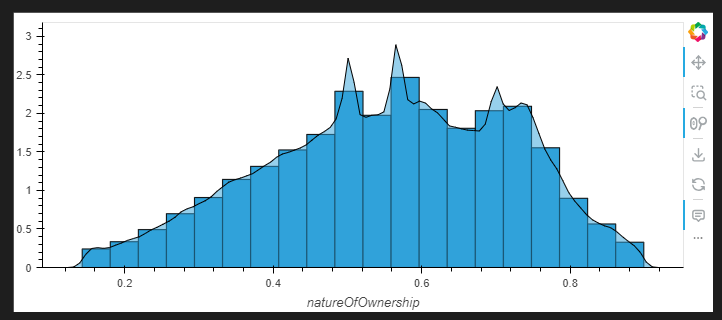

In that plots was used norm parameter for better plotting and it not so good represents real data distribution but can see that data also are not scaled in one range

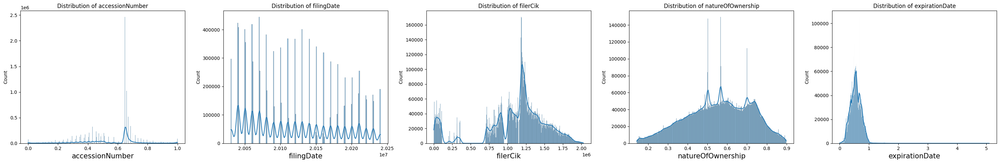

In [21]:
columns_to_plot = ['accessionNumber', 'filingDate', 'filerCik', 'natureOfOwnership', 'expirationDate']

# Create a figure and set of subplots
fig, axes = plt.subplots(1, len(columns_to_plot), figsize=(30, 5))

# Plot each column in a separate subplot
for ax, column in zip(axes, columns_to_plot):
    sns.histplot(cleaned_df[column].compute(), kde=True, ax=ax)
    ax.set_xlabel(column, fontsize=15)
    ax.set_title(f'Distribution of {column}')

# Adjust layout
plt.tight_layout()
plt.show()


<p>Here plots are more real but takes a lot time to compute</p>
<p>But we will use scaler to determine data in one same range</p>

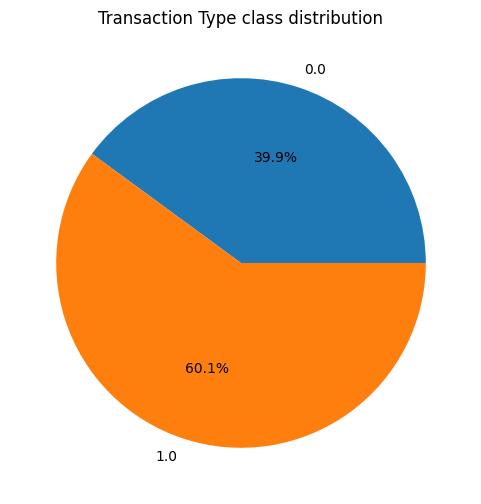

In [10]:
data=cleaned_df['transactionType'].value_counts().compute()
plt.figure(figsize=(6,6))
plt.pie(data ,labels=data.index, autopct='%1.1f%%')
plt.title('Transaction Type class distribution')
plt.show()

Can see that our classes are not balanced well

#### Data Transformation

In [18]:
from dask_ml.model_selection import train_test_split
from dask_ml.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import xgboost as xgb
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score

In [36]:
cleaned_df.describe().compute()

,accessionNumber,filingDate,filerCik,transactionType,tableRow,securityTitle,securityTitleFn,conversionOrExercisePrice,conversionOrExercisePriceFn,equitySwapInvolved,...,transactionPricePerShare,exerciseDate,exerciseDateFn,expirationDate,expirationDateFn,underlyingSecurityTitle,underlyingSecurityShares,sharesOwnedFollowingTransaction,directOrIndirectOwnership,natureOfOwnership
count,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,...,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07,1.016609e+07
mean,5.511660e-01,2.011987e+07,1.115363e+06,6.006784e-01,3.353950e+00,5.972452e-01,5.801304e-01,1.643098e+05,7.089692e-01,5.906522e-01,...,1.959508e+05,5.283792e-01,6.546898e-01,5.531341e-01,7.350854e-01,5.923696e-01,7.425557e+05,6.924469e+05,7.972365e-02,5.573183e-01
std,1.926044e-01,6.130863e+04,4.407726e+05,4.897590e-01,3.682466e+00,2.222953e-01,1.277309e-01,2.803374e+07,1.388656e-01,1.614061e-02,...,2.811842e+07,1.678788e-01,9.922956e-02,1.813608e-01,9.205145e-02,1.048866e-01,1.210016e+08,5.325130e+07,2.708649e-01,1.629412e-01
min,2.033197e-14,2.003050e+07,2.000000e+01,0.000000e+00,1.000000e+00,0.000000e+00,2.433067e-06,0.000000e+00,2.207237e-07,5.900157e-01,...,0.000000e+00,1.342223e-08,2.207237e-07,9.206997e-07,2.207237e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.343324e-01
25%,4.540099e-01,2.008091e+07,1.096325e+06,0.000000e+00,1.000000e+00,4.795343e-01,5.027319e-01,6.937500e+00,6.378418e-01,5.900157e-01,...,0.000000e+00,4.419513e-01,6.150388e-01,4.447317e-01,6.995937e-01,5.975912e-01,2.468000e+03,2.107181e+03,0.000000e+00,4.565192e-01
50%,6.488069e-01,2.015040e+07,1.273666e+06,1.000000e+00,2.000000e+00,6.140927e-01,5.852869e-01,2.490000e+01,7.474044e-01,5.900157e-01,...,2.344865e+03,5.689793e-01,6.829002e-01,5.650165e-01,7.617021e-01,5.975912e-01,9.756500e+03,1.400000e+04,0.000000e+00,5.741551e-01
75%,6.595007e-01,2.020090e+07,1.466099e+06,1.000000e+00,4.000000e+00,8.268957e-01,6.975374e-01,1.541778e+04,8.371537e-01,5.900157e-01,...,7.809753e+04,6.643357e-01,7.435855e-01,6.965741e-01,7.926130e-01,5.975912e-01,3.860000e+04,1.111110e+05,0.000000e+00,6.998031e-01
max,1.000000e+00,2.024063e+07,2.028892e+06,1.000000e+00,3.000000e+01,1.515175e+00,3.624980e+00,2.037763e+10,4.325561e+00,1.000000e+00,...,2.038320e+10,2.570466e+00,1.232020e+00,5.092720e+00,1.146255e+00,1.000000e+00,8.836963e+10,3.756767e+10,1.000000e+00,8.954615e-01


Testing MinMaxScaler
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1217857
         1.0       1.00      1.00      1.00   1830805

    accuracy                           1.00   3048662
   macro avg       1.00      1.00      1.00   3048662
weighted avg       1.00      1.00      1.00   3048662



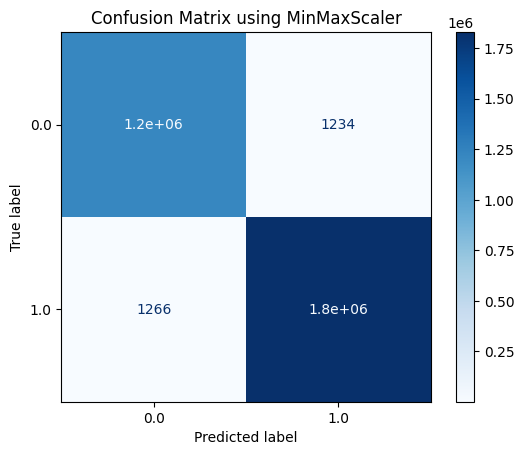

Testing StandardScaler
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1217857
         1.0       1.00      1.00      1.00   1830805

    accuracy                           1.00   3048662
   macro avg       1.00      1.00      1.00   3048662
weighted avg       1.00      1.00      1.00   3048662



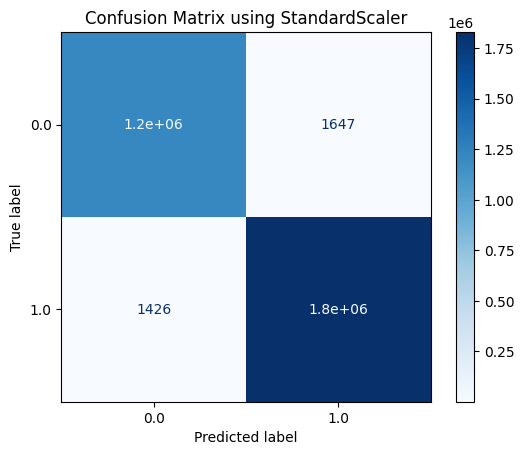

Testing RobustScaler
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1217857
         1.0       1.00      1.00      1.00   1830805

    accuracy                           1.00   3048662
   macro avg       1.00      1.00      1.00   3048662
weighted avg       1.00      1.00      1.00   3048662



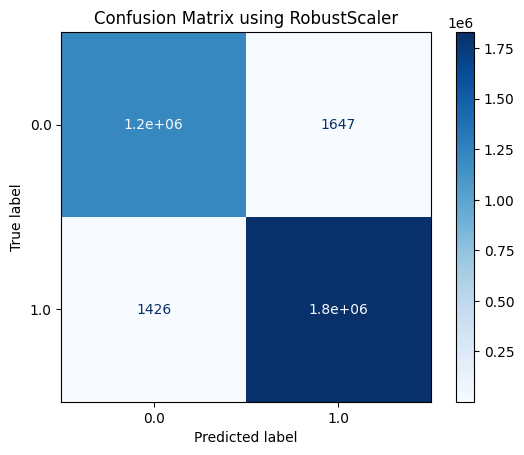

In [35]:
features_to_scale = [
    'filerCik', 
    'conversionOrExercisePrice', 
    'conversionOrExercisePriceFn', 
    'equitySwapInvolved', 
    'transactionShares', 
    'transactionPricePerShare', 
    'natureOfOwnership', 
    'underlyingSecurityShares', 
    'sharesOwnedFollowingTransaction'
]

# Define scalers to test
scalers = {
    'MinMaxScaler': MinMaxScaler(),
    'StandardScaler': StandardScaler(),
    'RobustScaler': RobustScaler()
}

# Prepare data
X = cleaned_df.drop('transactionType', axis=1)
y = cleaned_df['transactionType']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=42)

# Initialize the model
model = xgb.XGBClassifier(random_state=42, learning_rate=0.01, use_label_encoder=False, eval_metric='logloss', tree_method='exact')

for scaler_name, scaler in scalers.items():
    print(f"Testing {scaler_name}")
    
    # Scale the features
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()
    
    X_train_scaled[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])
    X_test_scaled[features_to_scale] = scaler.transform(X_test[features_to_scale])
    
    # Fit the model
    model.fit(X_train_scaled, y_train)
    
    # Make predictions
    predictions = model.predict(X_test_scaled)
    
    # Print classification report
    print(classification_report(y_test, predictions))
    
    # Display confusion matrix
    ConfusionMatrixDisplay.from_predictions(y_test, predictions, cmap='Blues')
    plt.title(f"Confusion Matrix using {scaler_name}")
    plt.show()

<p>As we can see that the best scaler for our data is MinMaxScaler and will use it</p>
<p>Also we can see precision=recall=f1-score=1 that means like overfiting but it possible a result of unbalance data</p>

#### Train the model and get predictions

In [9]:
X = cleaned_df.drop('transactionType', axis=1)
y = cleaned_df['transactionType']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [10]:
model = xgb.XGBClassifier(random_state=42,learning_rate=0.01, balance_classes=True, tree_method='exact')

In [11]:
model.fit(X_train,y_train)

XGBClassifier(balance_classes=True, learning_rate=0.01, random_state=42,
              tree_method='exact')

In [12]:
predictions = model.predict(X_test)

In [13]:
accuracy_score(predictions, y_test)

0.9991911213596771

In [14]:
confusion_matrix(predictions, y_test)

array([[1216895,    1380],
       [   1086, 1829304]], dtype=int64)

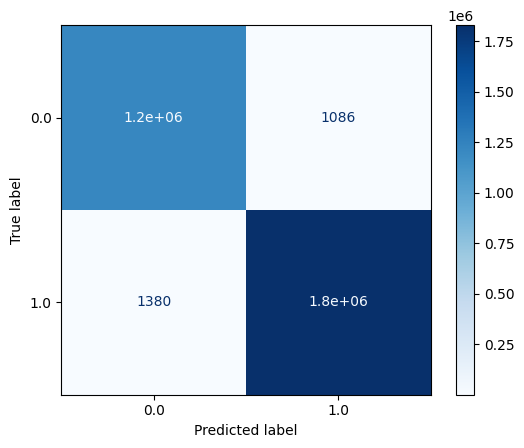

In [15]:
ConfusionMatrixDisplay.from_predictions(y_test, predictions, cmap='Blues')

In [16]:
print(classification_report(predictions, y_test))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1218275
         1.0       1.00      1.00      1.00   1830390

    accuracy                           1.00   3048665
   macro avg       1.00      1.00      1.00   3048665
weighted avg       1.00      1.00      1.00   3048665



Can see that accuracy of the model is 99% but should be class balancing

#### Class Balancing

In [2]:
# Multi-threaded processing
import dask
import dask.dataframe as dd

# Plotting
import hvplot.dask

# Class balancing
from imblearn.over_sampling import ADASYN
# from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek
from crucio import SMOTEENN
from imblearn.under_sampling import RandomUnderSampler


cleaned_df = dd.read_csv('cleaned_data_outliers.csv')

In [5]:
cleaned_df = cleaned_df.compute()

In [3]:
cleaned_df['transactionType'] = cleaned_df['transactionType'].replace({1.0: 1, 0.0: 0}).astype(int)

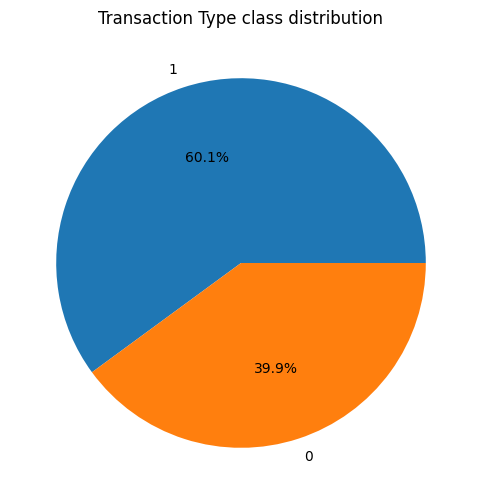

In [6]:
data=cleaned_df['transactionType'].value_counts()
plt.figure(figsize=(6,6))
plt.pie(data ,labels=data.index, autopct='%1.1f%%')
plt.title('Transaction Type class distribution')
plt.show()

In [7]:
cleaned_df['transactionType'].value_counts()

transactionType
1    6106552
0    4059541
Name: count, dtype: int64

In [7]:
random_undersampler = RandomUnderSampler(random_state=42)
X = cleaned_df.drop('transactionType', axis=1)
y = cleaned_df['transactionType']
X_res, y_res = random_undersampler.fit_resample(X, y)

In [8]:
cleaned_df = pd.concat([X_res, y_res], axis=1)
cleaned_df = dd.from_pandas(cleaned_df)

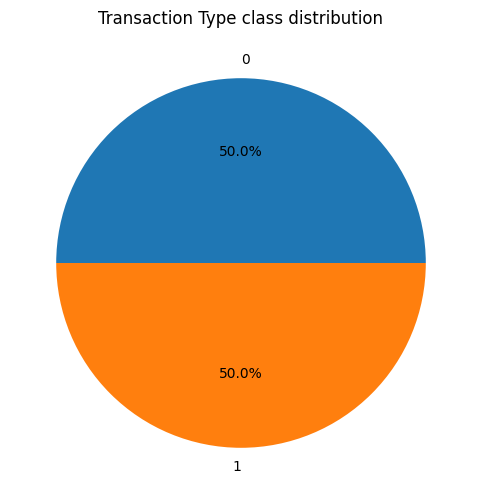

In [9]:
data=cleaned_df['transactionType'].value_counts().compute()
plt.figure(figsize=(6,6))
plt.pie(data ,labels=data.index, autopct='%1.1f%%')
plt.title('Transaction Type class distribution')
plt.show()

<p>I have used RandomUnderSampler because my dataset has more that 10mln data rows and computation time is very long</p>
<p>Is better to use oversampling technique but algorithms like SMOTE SMOTEEN ADSYN inside bases on KNN algo and it computes a lot of time</p>
<p>Check the results</p>

In [27]:
X = cleaned_df.drop('transactionType', axis=1)
y = cleaned_df['transactionType']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [28]:
model.fit(X_train,y_train)

XGBClassifier(balance_classes=True, learning_rate=0.01, random_state=42,
              tree_method='exact')

In [29]:
predictions = model.predict(X_test)

In [61]:
probabilities = model.predict_proba(X_test)

In [30]:
accuracy_score(predictions, y_test)

0.9992699247148336

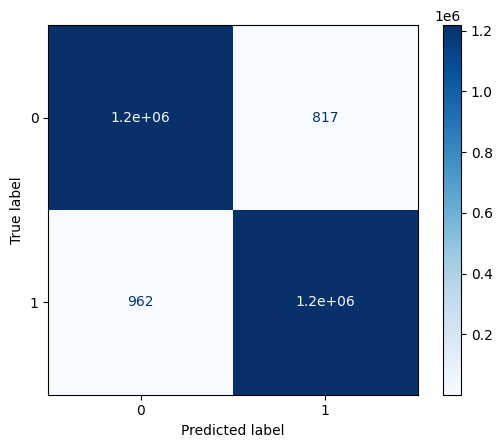

In [31]:
ConfusionMatrixDisplay.from_predictions(y_test, predictions, cmap='Blues')

In [32]:
print(classification_report(predictions, y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1217946
           1       1.00      1.00      1.00   1218789

    accuracy                           1.00   2436735
   macro avg       1.00      1.00      1.00   2436735
weighted avg       1.00      1.00      1.00   2436735



<p>Accuracy is a little bit better but not dramatic</p>
<ul>
    <li>Was - 0.9991911213596771</li>
    <li>Became - 0.9992699247148336</li>
</ul>
<p>Now when classes are balanced we can say that results are real and our model predicts on 99.92% 🥳</p>

In [ ]:
# class balancing using class weights from XGBoost model
model.fit(X_train,y_train, sample_weight=cleaned_df['transactionType'])

#### Feature Selection

In [10]:
from dask_ml.model_selection import RandomizedSearchCV, train_test_split
from dask_ml.preprocessing import MinMaxScaler
import xgboost as xgb
from kydavra import PearsonCorrelationSelector, PointBiserialCorrSelector
from sklearn.metrics import roc_curve, auc
import scikitplot as skplt

In [38]:
pearson = PearsonCorrelationSelector()
pearson_selected_columns = pearson.select(cleaned_df.compute(), 'transactionType')
print(f"Selected Features : {pearson_selected_columns}")

Selected Features : ['accessionNumber', 'natureOfOwnership']


In [39]:
point_biserial = PointBiserialCorrSelector(last_level=1)
point_biserial_selected_column = point_biserial.select(cleaned_df.compute(), 'transactionType')
print(f"Selected Features : {point_biserial_selected_column}")

Selected Features : ['accessionNumber']


<p>Based on selection algorithms is more better to use ['accessionNumber', 'natureOfOwnership']</p>
<p>Will not use just ['accessionNumber'] because will be the case that accessionNumber 100% determines transactionType</p>

#### Hyperparameter tuning

In [11]:
features_to_scale = [
    'filerCik', 
    'conversionOrExercisePrice', 
    'conversionOrExercisePriceFn', 
    'equitySwapInvolved', 
    'transactionShares', 
    'transactionPricePerShare', 
    'natureOfOwnership', 
    'underlyingSecurityShares', 
    'sharesOwnedFollowingTransaction'
]

scaler = MinMaxScaler()

cleaned_df[features_to_scale] = scaler.fit_transform(cleaned_df[features_to_scale])
cleaned_df[features_to_scale] = scaler.transform(cleaned_df[features_to_scale])

In [12]:
cleaned_df.describe().compute().transpose().applymap(lambda x: format(x, '.3f'))

,count,mean,std,min,25%,50%,75%,max
accessionNumber,8119082.000,0.520,0.197,0.000,0.387,0.539,0.660,1.000
filingDate,8119082.000,20118268.018,60975.735,20030505.000,20061030.000,20110404.000,20170316.000,20240628.000
filerCik,8119082.000,-0.000,0.000,-0.000,-0.000,-0.000,-0.000,-0.000
tableRow,8119082.000,3.598,3.790,1.000,1.000,2.000,5.000,30.000
securityTitle,8119082.000,0.576,0.225,0.000,0.438,0.591,0.757,1.515
securityTitleFn,8119082.000,0.569,0.127,0.000,0.485,0.562,0.667,3.625
conversionOrExercisePrice,8119082.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
conversionOrExercisePriceFn,8119082.000,0.037,0.007,-0.000,0.033,0.038,0.043,0.231
equitySwapInvolved,8119082.000,-1.436,0.088,-1.439,-1.439,-1.439,-1.439,1.000
transactionShares,8119082.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [13]:
X = cleaned_df.drop('transactionType', axis=1)
y = cleaned_df['transactionType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [21]:
xgb_model = xgb.XGBClassifier(eval_metric='logloss', random_state=42)

# Define the hyperparameter grid
param_dist = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'subsample': [0.7, 0.9],
    'colsample_bytree': [0.7, 0.9],
    'gamma': [0, 0.1],
    'reg_alpha': [0, 0.1],
    'reg_lambda': [0.5, 1.0],
}

In [22]:
random_search = RandomizedSearchCV(xgb_model, param_distributions=param_dist, n_iter=50)

In [23]:
# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_iter=50,
                   param_distributions={'colsample_bytree': [0.7, 0.9],
                                        'gamma': [0, 0.1],
                                        'learning_rate': [0.01, 0.1],
                                        'max_depth': [3, 5],
                                        'n_estimators': [100, 200],
                                        'reg_alpha': [0, 0.1],
                                        'reg_lambda': [0.5, 1.0],
                                        'subsample': [0.7, 0.9]})

In [24]:
# Get the best model
best_model = random_search.best_estimator_
print("Best Parameters:", random_search.best_params_)

Best Parameters: {'subsample': 0.7, 'reg_lambda': 0.5, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.7}


In [14]:
final_model = xgb.XGBClassifier(
    eval_metric='logloss',
    random_state=42,
    subsample=0.7,
    reg_lambda=0.5,
    reg_alpha=0,
    n_estimators=200,
    max_depth=5,
    learning_rate=0.1,
    gamma=0.1,
    colsample_bytree=0.7
)

final_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [15]:
predictions = final_model.predict(X_test)

In [16]:
probabilities = final_model.predict_proba(X_test)

In [19]:
accuracy_score(predictions, y_test)

0.9999626331860013

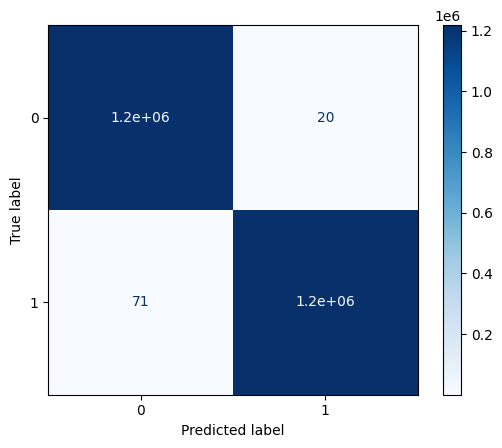

In [20]:
ConfusionMatrixDisplay.from_predictions(y_test, predictions, cmap='Blues')

In [21]:
print(classification_report(predictions, y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1217344
           1       1.00      1.00      1.00   1217972

    accuracy                           1.00   2435316
   macro avg       1.00      1.00      1.00   2435316
weighted avg       1.00      1.00      1.00   2435316



Text(0.5, 1.0, 'ROC Curves - XGBoost Classifier')

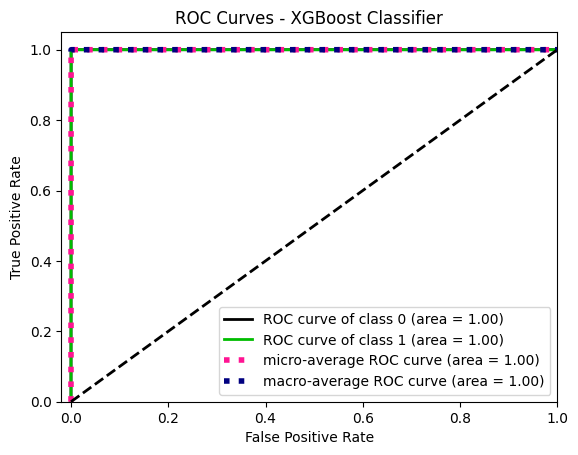

In [25]:
plot = skplt.metrics.plot_roc(y_test, probabilities)
plt.xlim(-0.02,1)
plt.title("ROC Curves - XGBoost Classifier")

<p>I have used here RandomizedSearchCV algo to find the best hyperparameters for my model</p>
<p>I have  not use the GridSearch because it takes a lot of time to compute each combination of parameters</p>
<p>RandomizedSearchCV instead make it random but at the same time save approximately the best hyperparameters for better accuracy</p>

#### Model Interpretation

In [28]:
import shap
import fasttreeshap
shap.initjs()

In [58]:
sampled_df = X_train.sample(frac=100/len(X_train), random_state=42)

In [61]:
explainer = shap.KernelExplainer(final_model.predict, sampled_df.compute(), n_jobs=-1, feature_names=list(cleaned_df.columns)[:-1])
shap_values = explainer.shap_values(sampled_df.compute())

  0%|          | 0/100 [00:00<?, ?it/s]

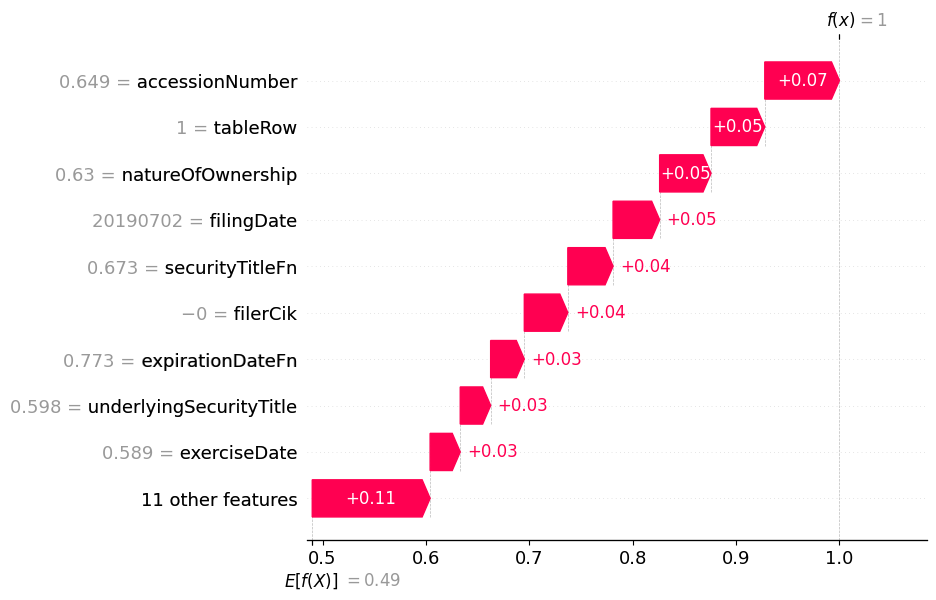

In [69]:
# Ensure shap_values is an Explanation object
shap_values_explanation = shap.Explanation(shap_values, base_values=explainer.expected_value, data=sampled_df.compute(), feature_names=list(cleaned_df.columns)[:-1])

# Plot the waterfall plot for the first instance
shap.plots.waterfall(shap_values_explanation[0])

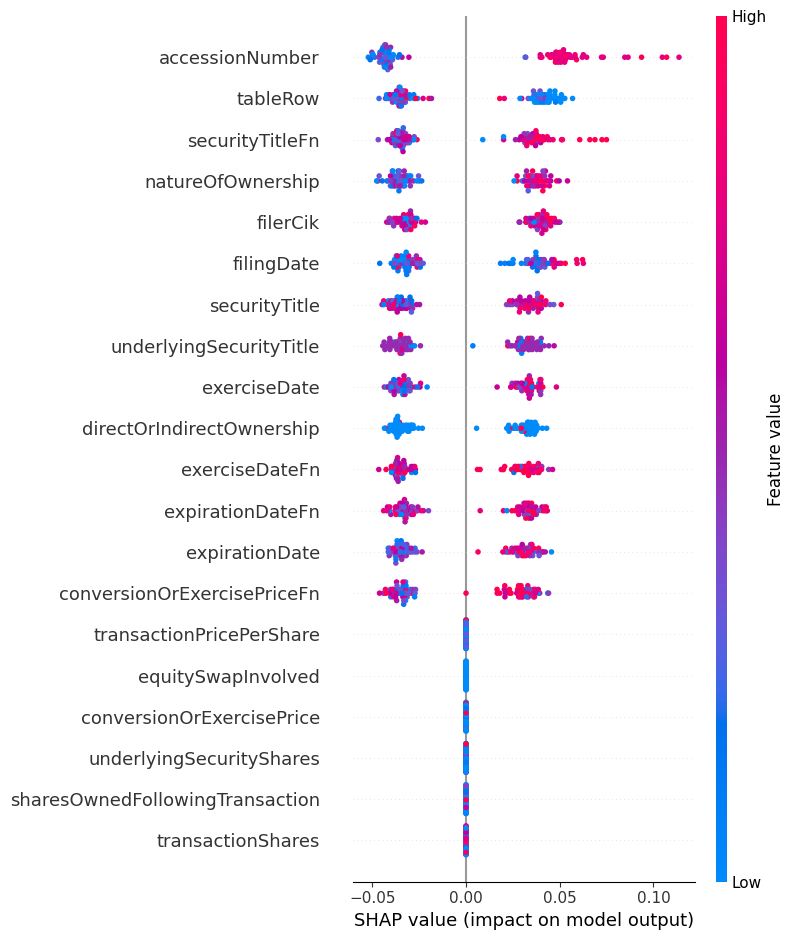

In [62]:
shap.summary_plot(shap_values, sampled_df.compute(), feature_names=list(cleaned_df.columns)[:-1])

<p>Here was taken a sample of data to interpret the model</p>
<p>I have used not full dataset because when we interpret with SHAP values it also makes multiple combinations of the parameters and data to process growth</p>
<p></p>
<p>From model interpretation plot we can say that as was mentioned before accessionNumber as a natureOfOwnership has the biggest impact to the model that other features</p>
<p>And possibly features witch are on a 0.00 axes can be drop because they have 0% impact to the model but takes memory to compute</p>

#### Conclusion
<p>The trained model has such statistics</p>
<ol>
    <li>Accuracy - 0.9999626331860013 = 99.99%</li>
    <li>F1-score - 1.0</li>
    <li>Precision - 1.0</li>
    <li>Recall - 1.0</li>
</ol>
<p>That's a grate result 🥳</p>